In [4]:
# importing libraries
import pandas as pd
import numpy as np
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
#from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score

# for visualisation
import matplotlib.pyplot as plt
from sklearn.tree import export_graphviz
from IPython.display import Image  
from subprocess import call


In [5]:
titanic = pd.read_csv('Titanic.csv')

In [83]:
# DQ checks
# Finding null values per column
missing = pd.DataFrame({'Column':[],'Number of missing datapoints':[]})
for i in range(len(titanic.columns)):
    missing.loc[i,['Column']] = titanic.columns[i]
    missing.loc[i,['Number of missing datapoints']] = titanic.iloc[:,i].isnull().sum()

# look at the # of missing points in the first ten columns
missing = missing.sort_values(by = ['Number of missing datapoints'],ascending = False)
missing.reset_index(inplace = True, drop = True)
missing

,Column,Number of missing datapoints
0,Cabin,687.0
1,Age,177.0
2,Embarked,2.0
3,PassengerId,0.0
4,Survived,0.0
5,Pclass,0.0
6,Name,0.0
7,Sex,0.0
8,SibSp,0.0
9,Parch,0.0


In [84]:
# replace NA with mean imputation where possible
titanic['Age'] = titanic['Age'].fillna(titanic['Age'].mean())

In [85]:
# generate dummy variable for sex
titanic['Sex_dummy'] = np.where(titanic['Sex'].eq('female'),1,0)

In [86]:
# separate dependent and independent variable which are usable
y = titanic['Survived']
X = titanic[['Pclass','Age','SibSp','Parch','Sex_dummy']]

r = 4
# split training and testing data
X_train, X_test, y_train, y_test = train_test_split(X, 
                y, test_size=0.25, random_state=r)
# splitting testing data into development and testing data
X_train, X_dev, y_train, y_dev = train_test_split(X_train, y_train, test_size=0.25, random_state=r)

In [87]:
# training a model without pruning
unpruned_model = DecisionTreeClassifier(max_depth=None, random_state=r)
unpruned_model.fit(X_dev, y_dev)
print("Performance without pruning:", unpruned_model.score(X_test, y_test))
print("At depth:", unpruned_model.tree_.max_depth)

Performance without pruning: 0.7399103139013453
At depth: 12


In [88]:
X.columns

Index(['Pclass', 'Age', 'SibSp', 'Parch', 'Sex_dummy'], dtype='object')

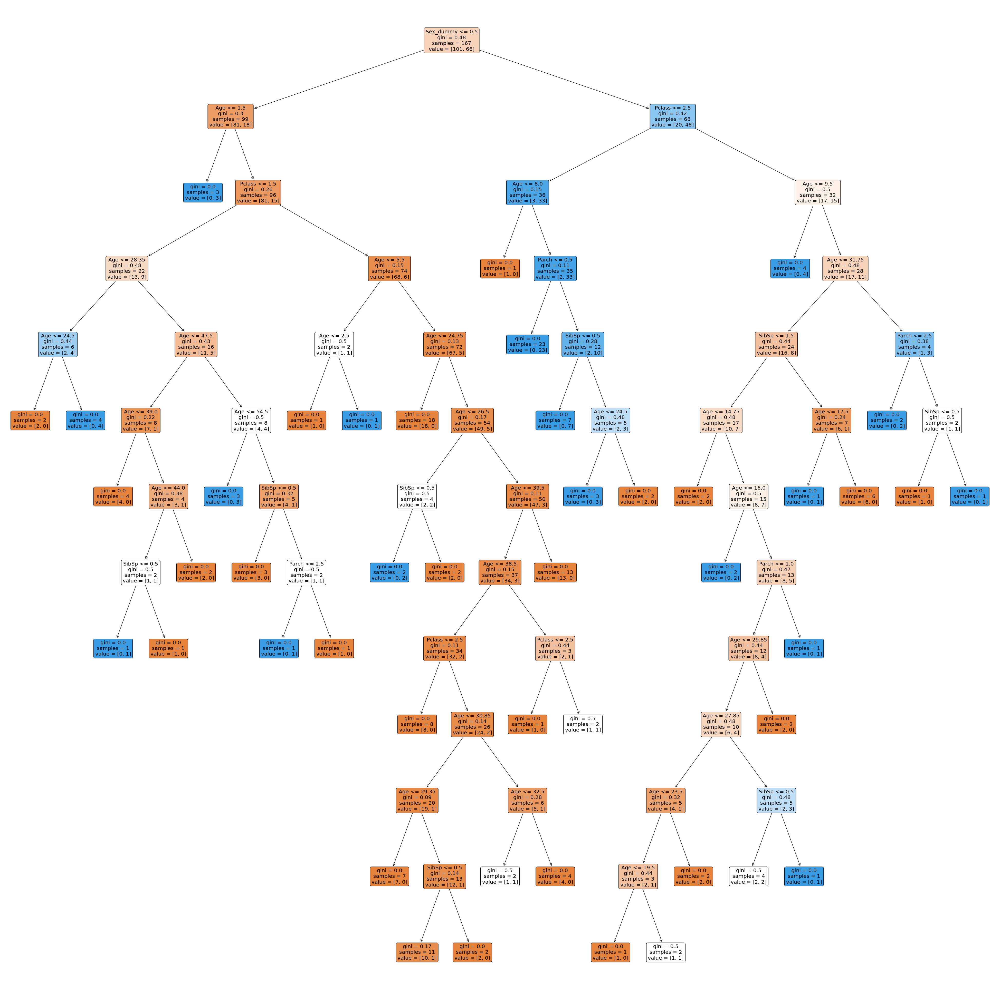

In [93]:
# plot the tree
fig = plt.figure(figsize = (50,50))
plt.tight_layout()
tree.plot_tree(unpruned_model,feature_names = X.columns , rounded = True, proportion = False, precision = 2, filled = True)
plt.show()

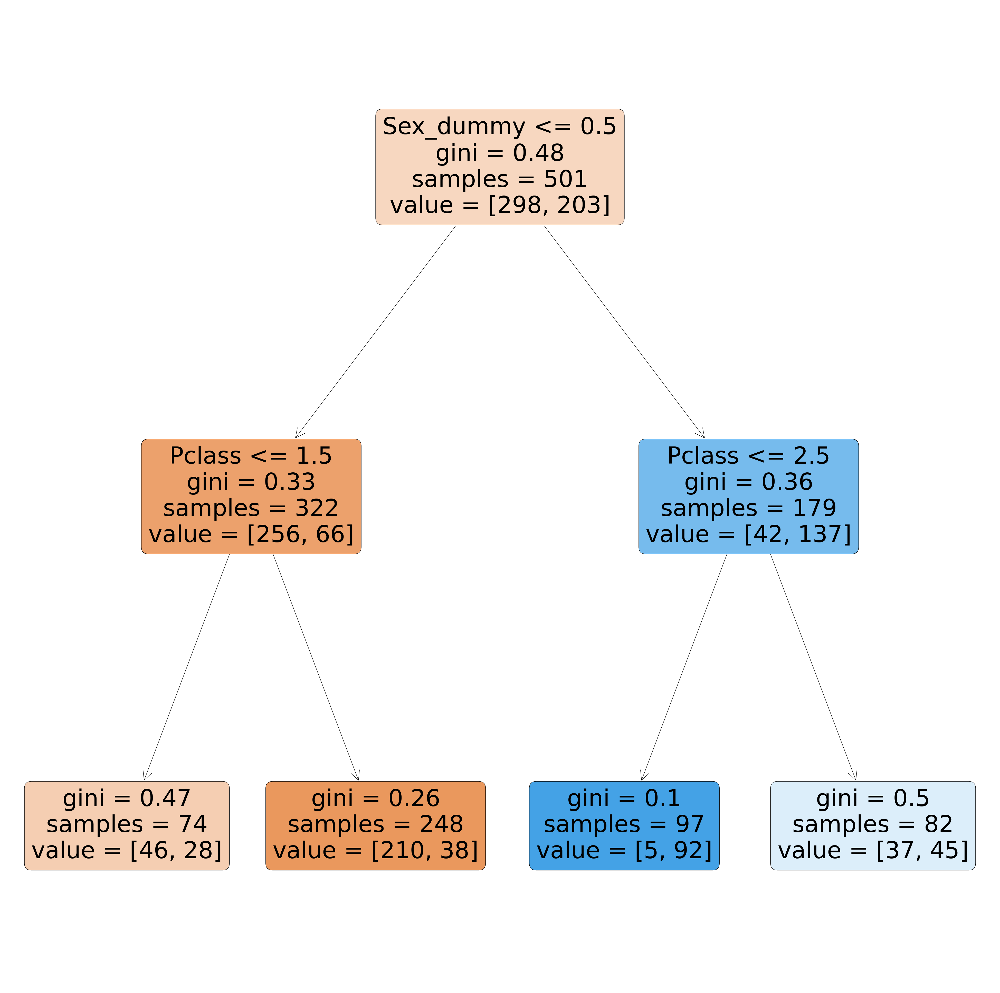

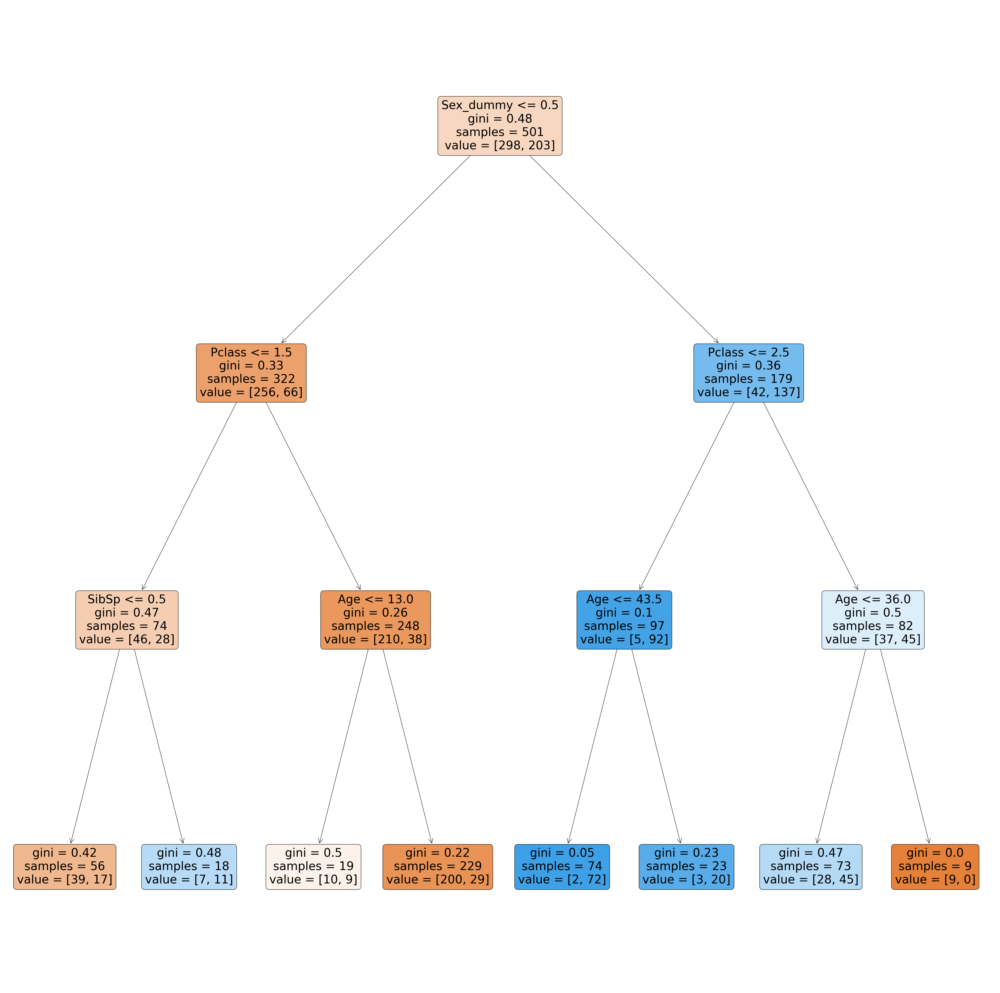

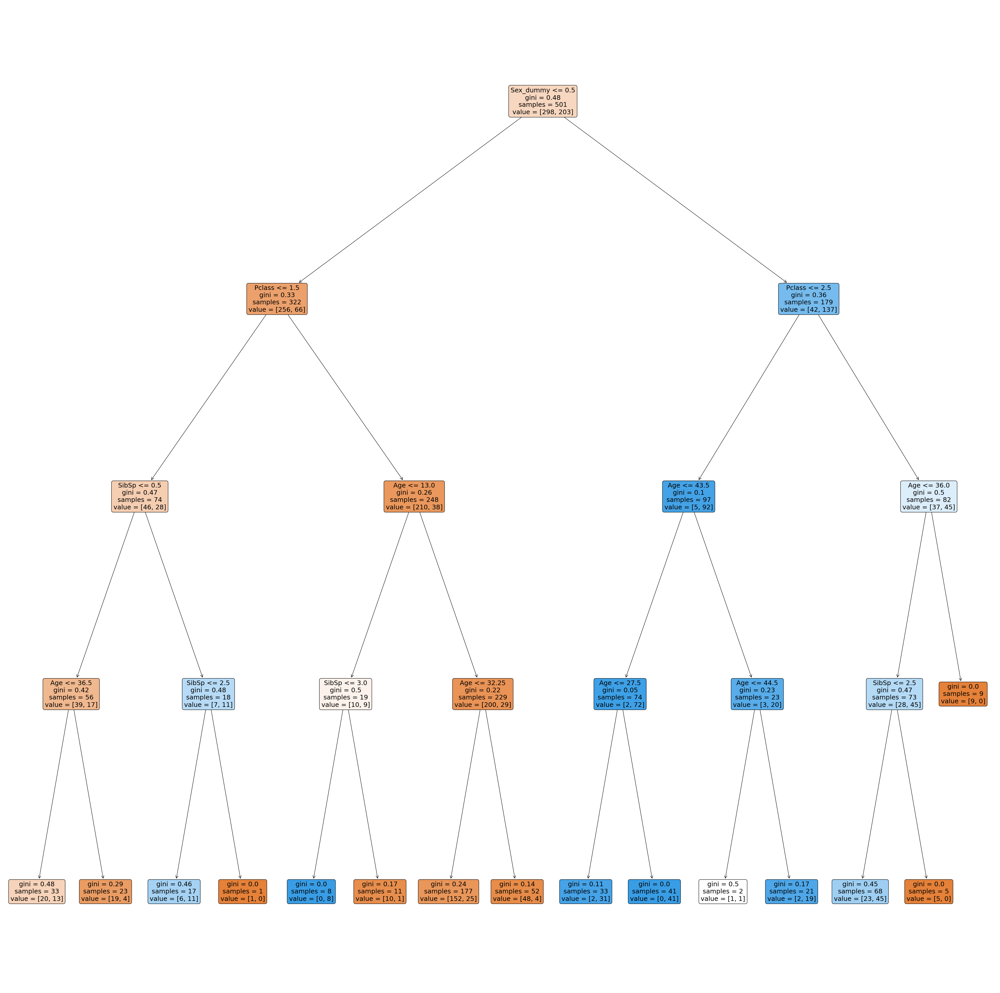

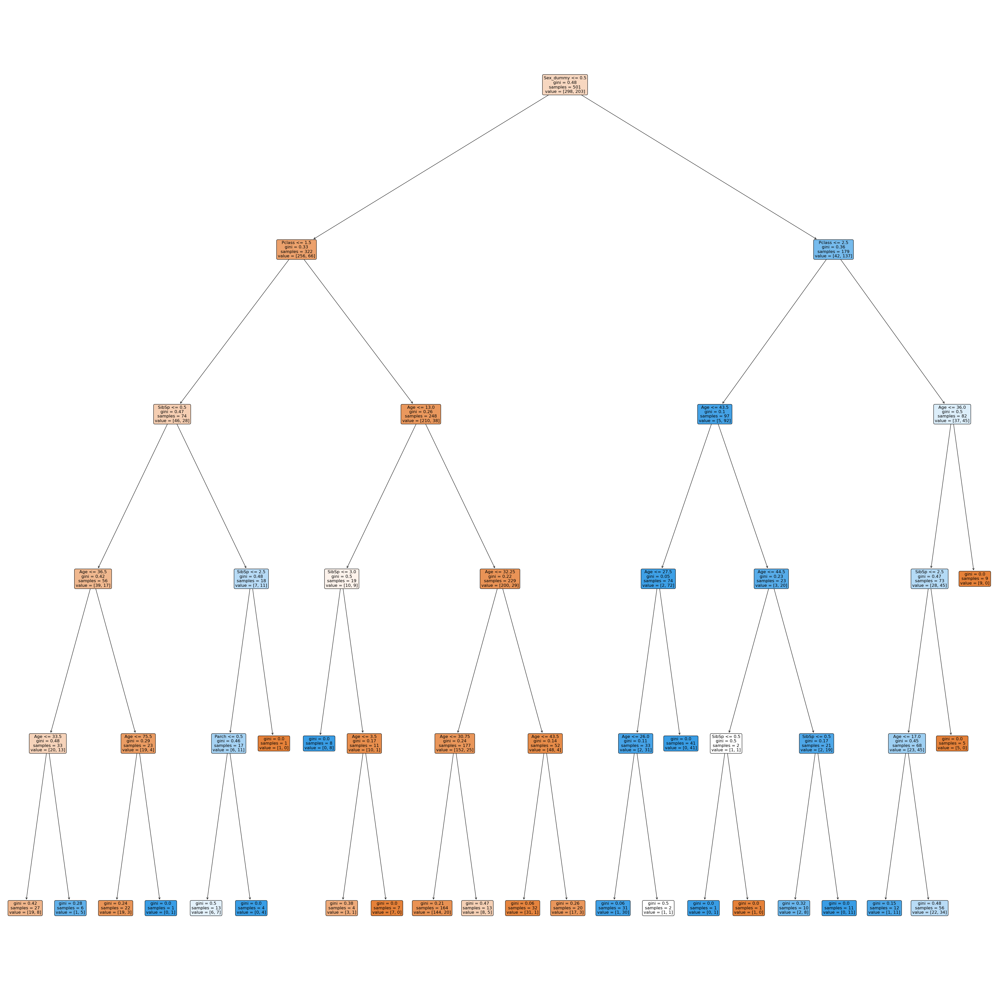

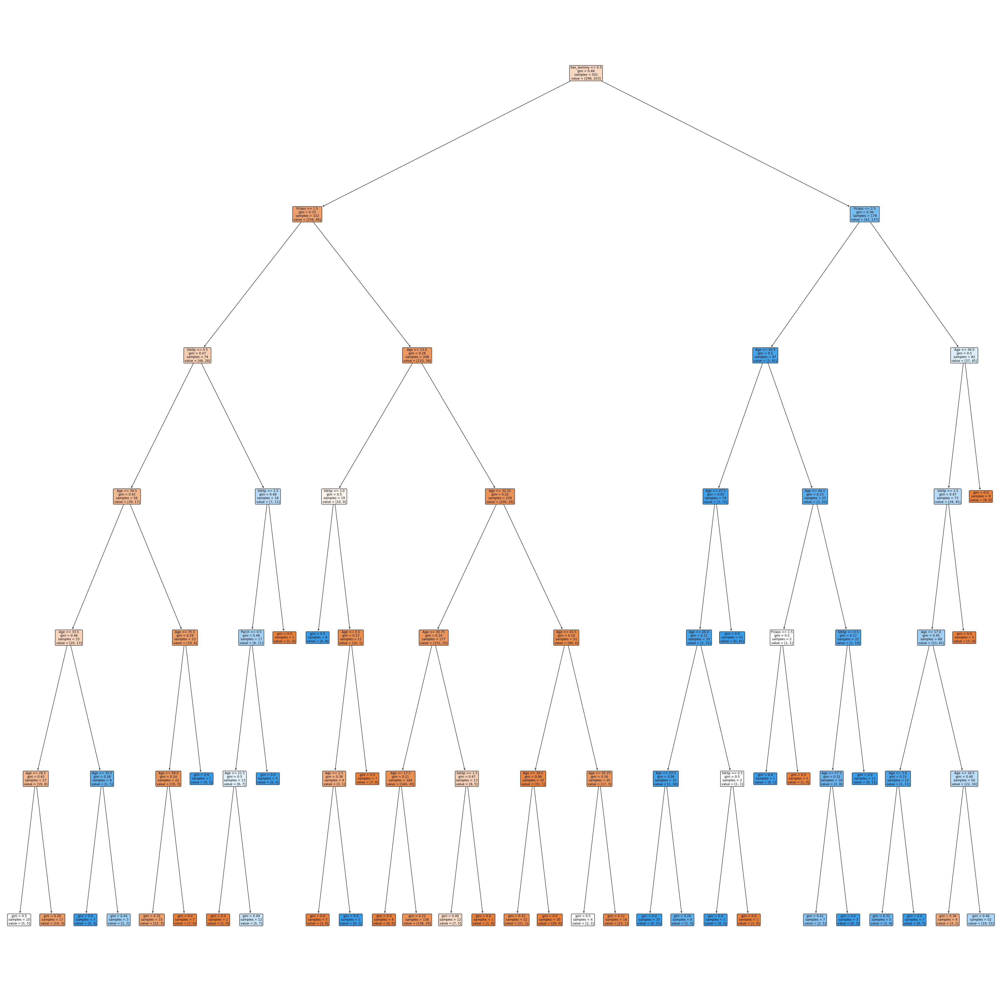

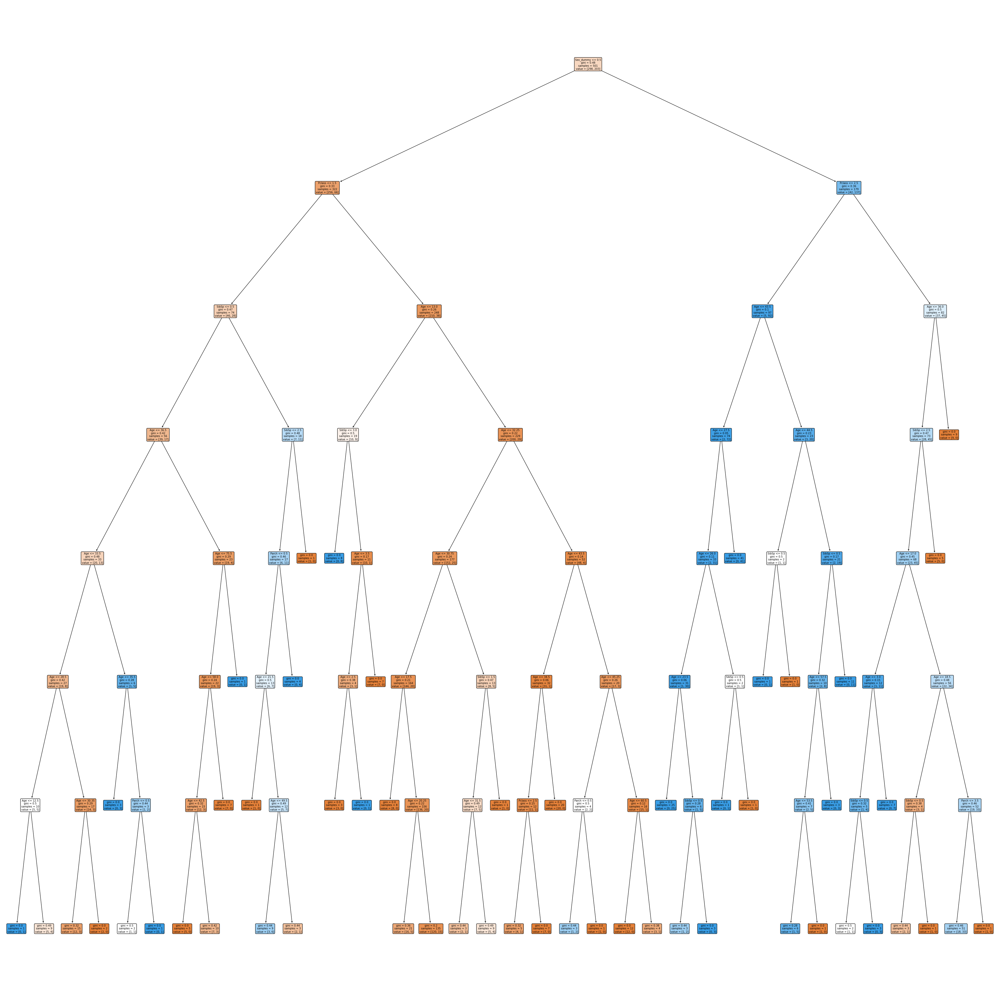

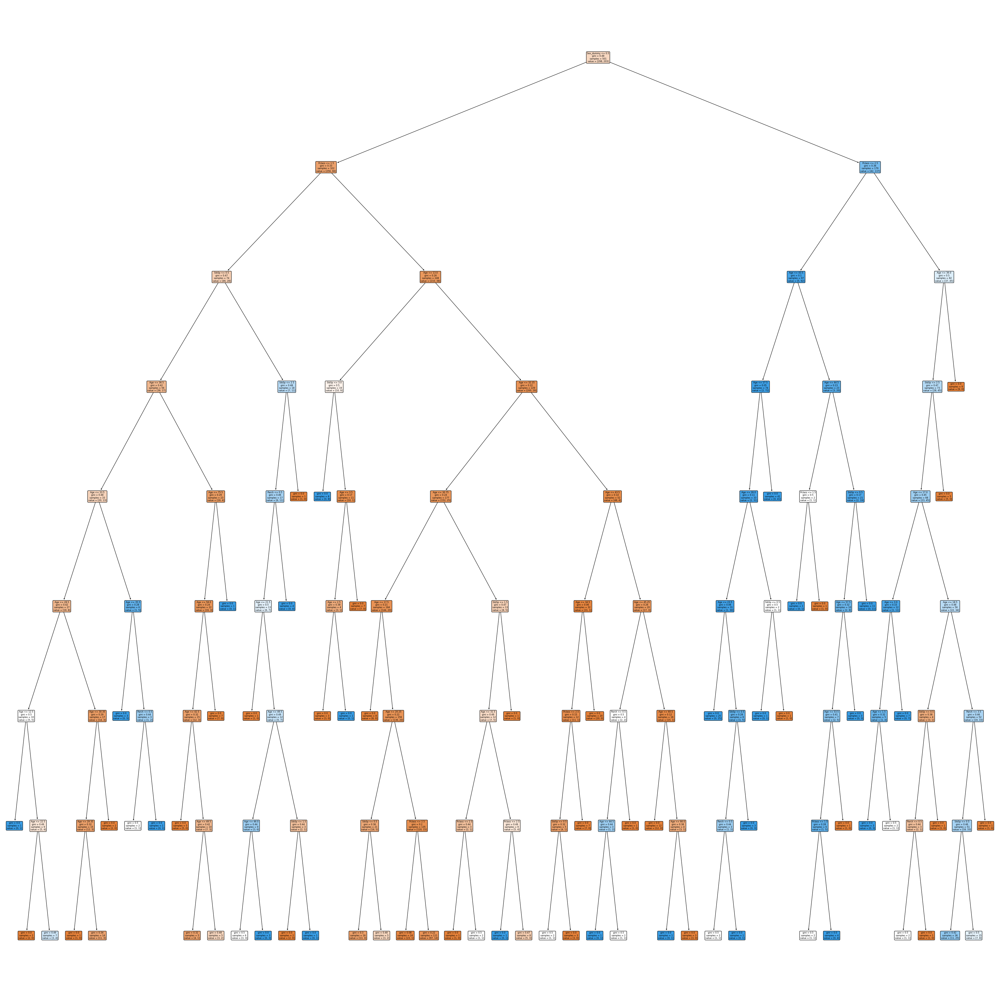

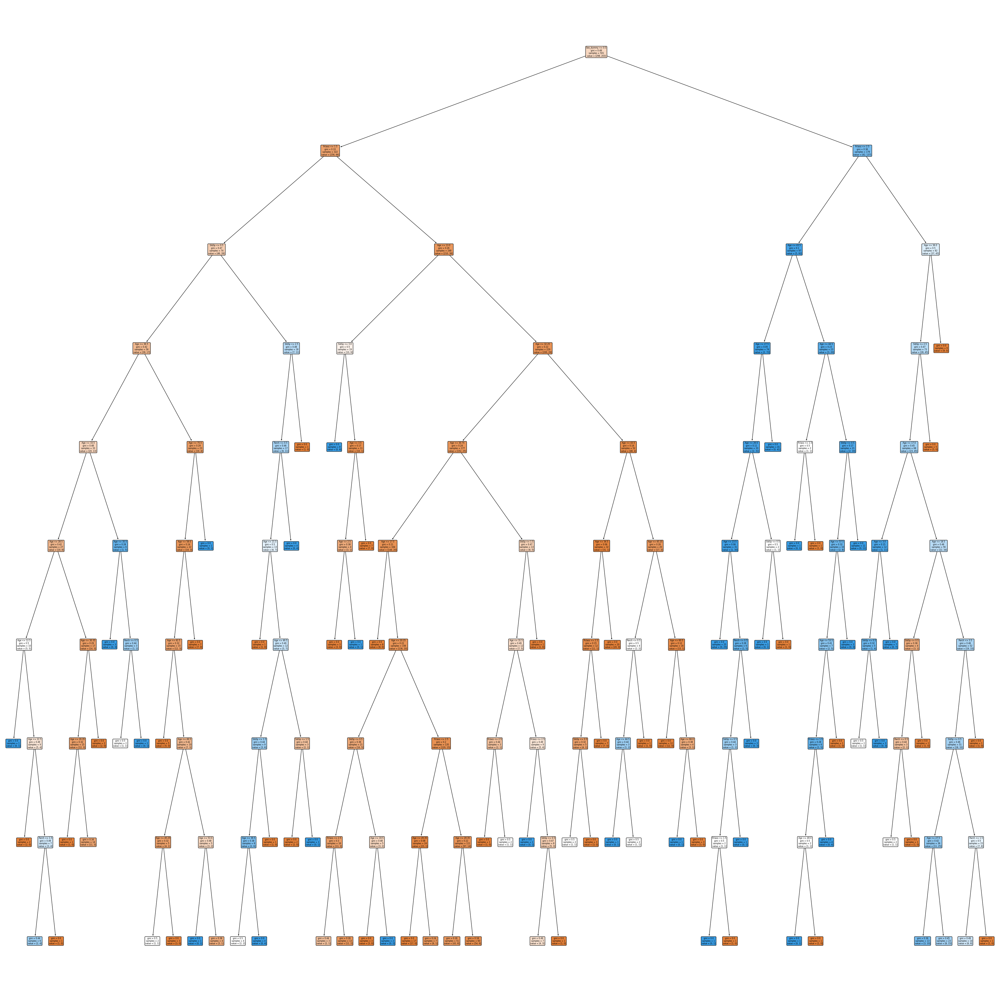

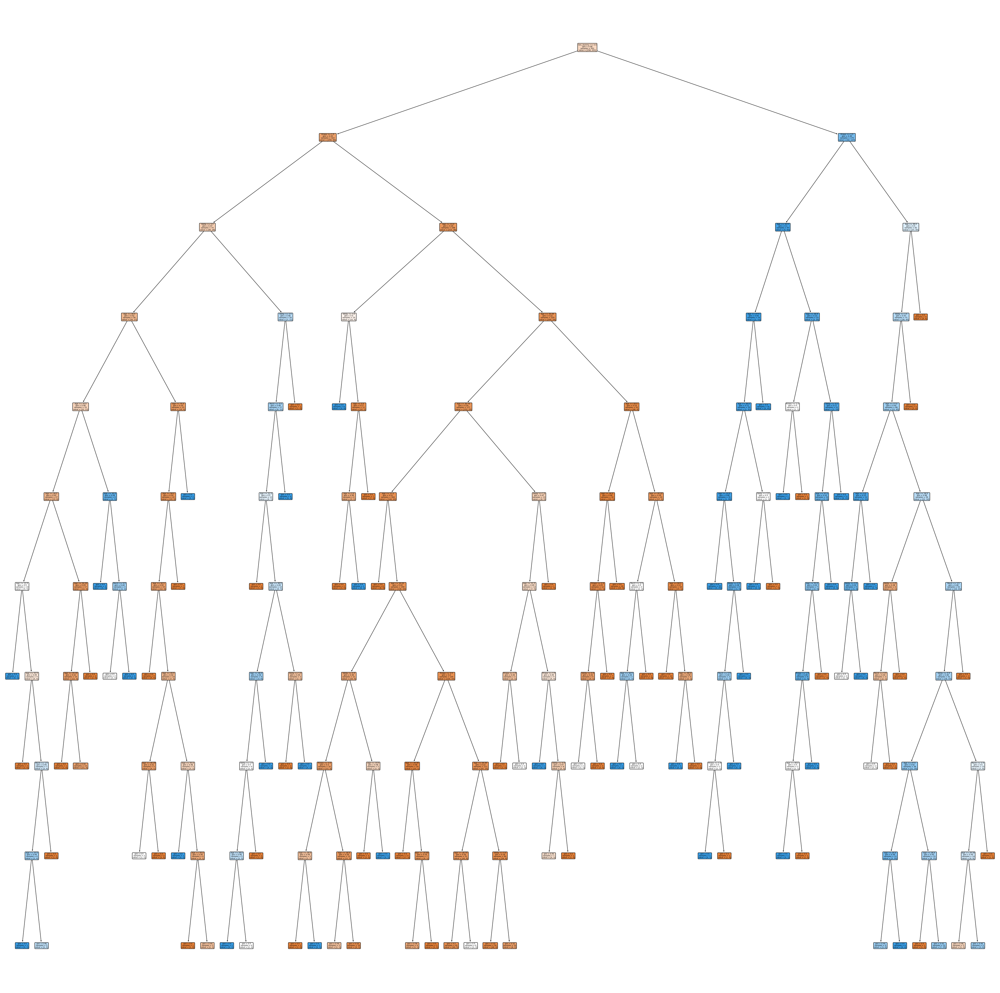

In [99]:
# create tree models with maxdepth between 2 and 10 with training and development data
pruned_scores = [] 
for i in range(2,11):
    clf = DecisionTreeClassifier(max_depth=i, random_state=r)
    clf.fit(X_train, y_train)
    score = clf.score(X_dev, y_dev)
    pruned_scores.append(score)
    
    fig = plt.figure(figsize = (50,50))
    plt.tight_layout()
    tree.plot_tree(clf,feature_names = X.columns , rounded = True, proportion = False, precision = 2, filled = True)
    plt.show()

In [100]:
pruned_scores

[0.7724550898203593,
 0.7664670658682635,
 0.7904191616766467,
 0.7904191616766467,
 0.8023952095808383,
 0.7724550898203593,
 0.7604790419161677,
 0.7724550898203593,
 0.7964071856287425]

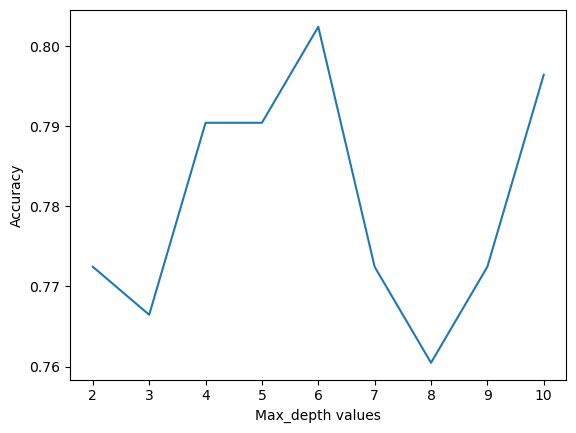

In [105]:
fig, ax = plt.subplots()
ax.plot(range(2,11), pruned_scores)
plt.xlabel("Max_depth values")
plt.ylabel("Accuracy")
ax.xaxis.set_ticks(range(2,11))
plt.show()

Based on this chart, the max depth preferable is 6.

In [109]:
# test pruned model on testing data

pruned_model = DecisionTreeClassifier(max_depth=6, random_state=r)
pruned_model.fit(X_test, y_test)
print("Performance with pruning:", unpruned_model.score(X_test, y_test))
print("At depth:", pruned_model.tree_.max_depth)

Performance with pruning: 0.7399103139013453
At depth: 6


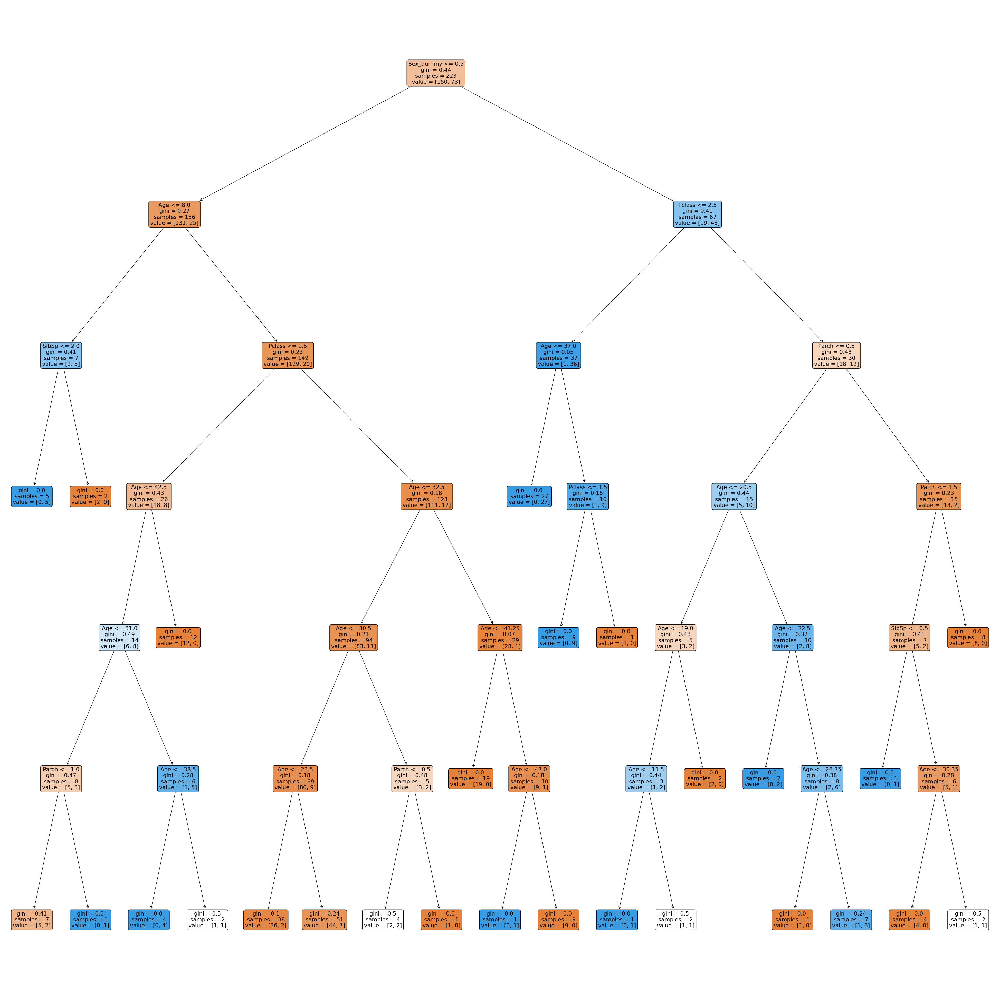

In [107]:
fig = plt.figure(figsize = (50,50))
plt.tight_layout()
tree.plot_tree(pruned_model,feature_names = X.columns , rounded = True, proportion = False, precision = 2, filled = True)
plt.show()